### Author : Ahmed hbaieb 

Overview : I'm gonna go through most files and try to extract the most insights 

In [2]:
import pandas as pd
import numpy as np 
import seaborn as sns 
import matplotlib.pyplot as plt 
import statistics as stat 

def line_plot(df , x , cols , rows ):
    
    fig = plt.figure(figsize=(cols*7, rows*5))

    for i, col in enumerate(df):        
        ax=fig.add_subplot(rows,cols,i+1)     
        #sns.histplot( df, x=col, ax = ax)     
        sns.lineplot(data = df, x = x , y=col)  

    fig.tight_layout()  
    plt.show()

def boxplot_viz(df , cols , rows  ) : 
 
    fig = plt.figure(figsize=(cols*5, rows*3))

    for i, col in enumerate(df):       
        ax=fig.add_subplot(rows,cols,i+1)     
        #sns.histplot( df, x=col, ax = ax)     
        sns.boxplot(data = df, x = col)  

    fig.tight_layout()  
    plt.show()

def kdeplot_viz(df , cols , rows  ) : 
      
    fig = plt.figure(figsize=(cols*5, rows*3))

    for i, col in enumerate(df):       
        ax=fig.add_subplot(rows,cols,i+1)     
        #sns.histplot( df, x=col, ax = ax)     
        sns.kdeplot(data = df, x = col , fill=True)  

    fig.tight_layout()  
    plt.show()


def KDE_Box_plot(df , col) :

    fig, axs = plt.subplots(nrows=2, figsize=(15,6))

    sns.kdeplot(data = df , x =  col, fill=True, ax=axs[0])
    axs[0].set_title('KDE Plot')

    sns.boxplot(data = df , x = col, ax=axs[1])
    axs[1].set_title('Box Plot')

    plt.tight_layout()
    plt.show()


#### africa_average_household_1992_2021

In [2]:
df_africa_average_household_1992_2021 = pd.read_csv('../../task 2 data preprocessing/processedData/africa_average_household_1992_2021.csv')
df_africa_average_household_1992_2021.drop(columns=['Unnamed: 0'],inplace=True)
df_africa_average_household_1992_2021 

,Country,Region,Year,avg_household_size
0,Algeria,Total,1992,7.958333
1,Algeria,"Hauts Plateaux Centre (Djelfa, Laghouat, MSila)",1992,7.958333
2,Algeria,"Hauts Plateaux Est (Setif, Batna, Khenchela, B...",1992,7.958333
3,Algeria,"Hauts Plateaux Ouest (Tiaret, Saida, Tissemsil...",1992,7.958333
4,Algeria,"Nord Centre (Alger, Blida, Boumerdes, Tipaza, ...",1992,7.958333
...,...,...,...,...
18235,Zimbabwe,Mashonaland West,2021,3.370000
18236,Zimbabwe,Masvingo,2021,3.260000
18237,Zimbabwe,Matebeleland North,2021,3.590000
18238,Zimbabwe,Matebeleland South,2021,3.520000


<AxesSubplot:xlabel='Year', ylabel='Density'>

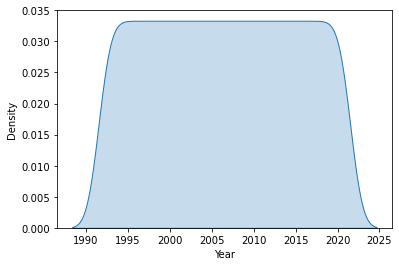

In [3]:
sns.kdeplot(df_africa_average_household_1992_2021.Year , fill=True  ) 

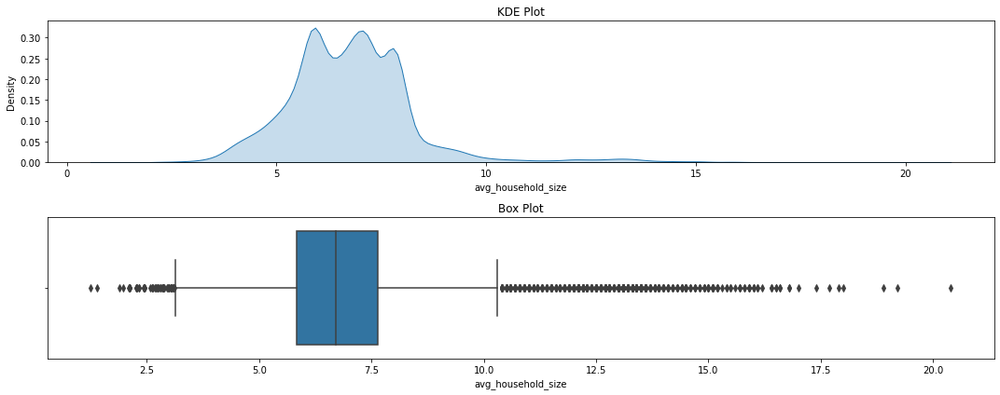

In [90]:

KDE_Box_plot(df_africa_average_household_1992_2021 , 'avg_household_size')


In [5]:
df_africa_average_household_1992_2021.columns

Index(['Country', 'Region', 'Year', 'avg_household_size'], dtype='object')

In [107]:
df_africa_average_household_1992_2021.describe()

,Year,avg_household_size
count,18240.000000,18240.000000
mean,2006.500000,6.783487
std,8.655679,1.611809
min,1992.000000,1.240000
25%,1999.000000,5.834437
50%,2006.500000,6.710000
75%,2014.000000,7.650130
max,2021.000000,20.400000


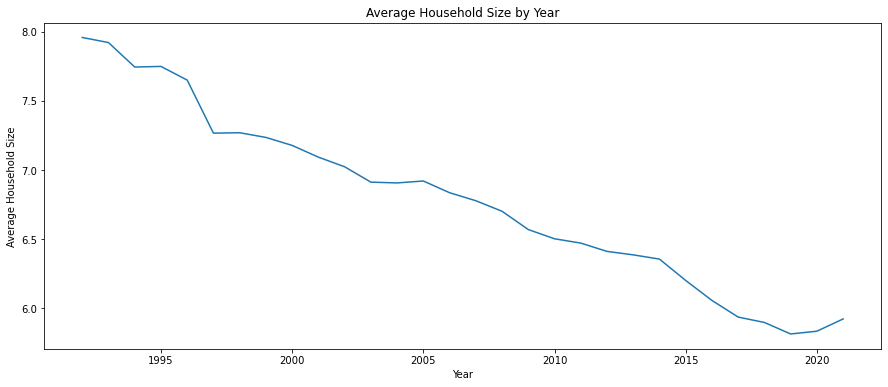

In [6]:
plt.figure(figsize=(15,6))
avg_size_by_year = df_africa_average_household_1992_2021.groupby('Year')['avg_household_size'].mean().plot(kind='line')

plt.xlabel('Year')
plt.ylabel('Average Household Size')
plt.title('Average Household Size by Year')
plt.show()


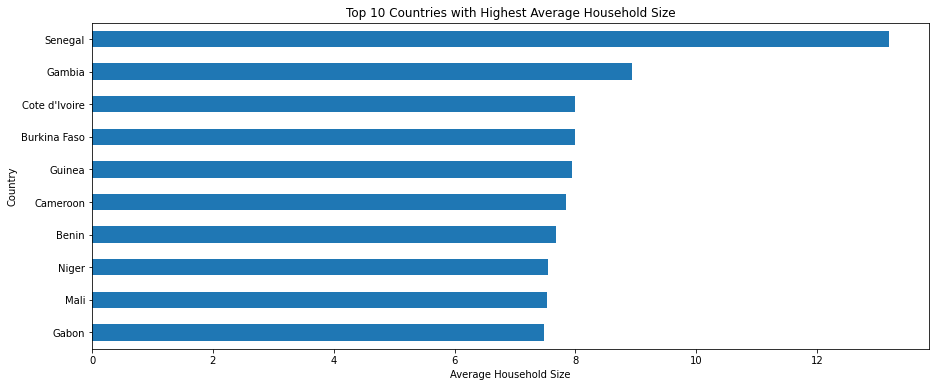

In [7]:
top_10_countries = df_africa_average_household_1992_2021.groupby('Country')['avg_household_size'].mean().nlargest(10).sort_values().plot(kind='barh' ,figsize=(15,6) )
plt.title('Top 10 Countries with Highest Average Household Size')
plt.xlabel('Average Household Size')
plt.ylabel('Country')
plt.show() 


#### large-african_cities_built_up_area_processed

Note : same data is also available for this file : africa_built_up_area_processed 

large-african_cities_built_up_area_processed has more data afterall

In [16]:
df_africa_built_up_area_processed = pd.read_csv('../../task 2 data preprocessing/processedData/large-african_cities_built_up_area_processed.csv')
df_africa_built_up_area_processed   

,Country,Measure,Large subnational region,Variable,Year,Value
0,Algeria,Square kilometers,Khenchela,Area built-up before,1975,2.743200
1,Algeria,Square kilometers,Khenchela,Area built-up before,1990,12.910500
2,Algeria,Square kilometers,Khenchela,Area built-up before,2000,22.636800
3,Algeria,Square kilometers,Khenchela,Area built-up before,2014,30.177000
4,Algeria,Square kilometers,Khenchela,Built-up since 1990,2000,9.726300
...,...,...,...,...,...,...
13495,South Sudan,Square kilometers,Unity,Built-up since 1975,1990,0.031500
13496,South Sudan,Square kilometers,Eastern Equatoria,Built-up since 1975,1990,0.153000
13497,South Sudan,Square kilometers,Western Equatoria,Built-up since 2000,2014,2.411100
13498,South Sudan,Percent of total land area,Western Equatoria,Built-up since 2000,2014,0.003055


In [18]:
df_africa_built_up_area_processed['Measure'].value_counts() 

Square kilometers             6770
Percent of total land area    6730
Name: Measure, dtype: int64

In [19]:
df_africa_built_up_area_processed.drop(columns=['Large subnational region'] ,inplace=True )

In [20]:
df_africa_built_up_area_processed.head(10) 

,Country,Measure,Variable,Year,Value
0,Algeria,Square kilometers,Area built-up before,1975,2.743200
1,Algeria,Square kilometers,Area built-up before,1990,12.910500
2,Algeria,Square kilometers,Area built-up before,2000,22.636800
3,Algeria,Square kilometers,Area built-up before,2014,30.177000
4,Algeria,Square kilometers,Built-up since 1990,2000,9.726300
5,Algeria,Square kilometers,Built-up since 1990,2014,17.266500
6,Algeria,Square kilometers,Built-up since 2000,2014,7.540200
7,Algeria,Square kilometers,Built-up since 1975,1990,10.167300
8,Algeria,Percent of total land area,Area built-up before,1975,0.028587
9,Algeria,Percent of total land area,Area built-up before,1990,0.134541


In [21]:
df_grouped = df_africa_built_up_area_processed.groupby(['Country', 'Year', 'Measure'])['Value'].sum().reset_index()
df_africa_built_up_area_processed = df_grouped.pivot_table(index=['Country', 'Year'], columns='Measure', values='Value').reset_index()
df_africa_built_up_area_processed   

Measure,Country,Year,Percent of total land area,Square kilometers
0,Algeria,1975,42.265524,899.2116
1,Algeria,1990,96.373449,2527.8138
2,Algeria,2000,105.582984,2940.2145
3,Algeria,2014,142.592573,4243.2885
4,Angola,1975,12.824710,575.5824
...,...,...,...,...
219,Zambia,2014,2.373306,808.6896
220,Zimbabwe,1975,10.048571,156.0033
221,Zimbabwe,1990,26.143701,403.4601
222,Zimbabwe,2000,34.771872,553.5441


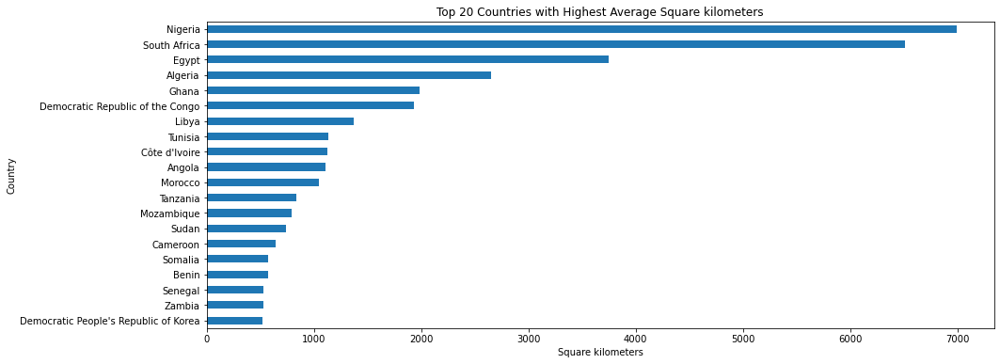

In [22]:
df_africa_built_up_area_processed.groupby('Country')['Square kilometers' ].mean().nlargest(20).sort_values().plot(kind='barh' ,figsize=(15,6) )
plt.title('Top 20 Countries with Highest Average Square kilometers')
plt.xlabel('Square kilometers')
plt.ylabel('Country') 
plt.show() 
 


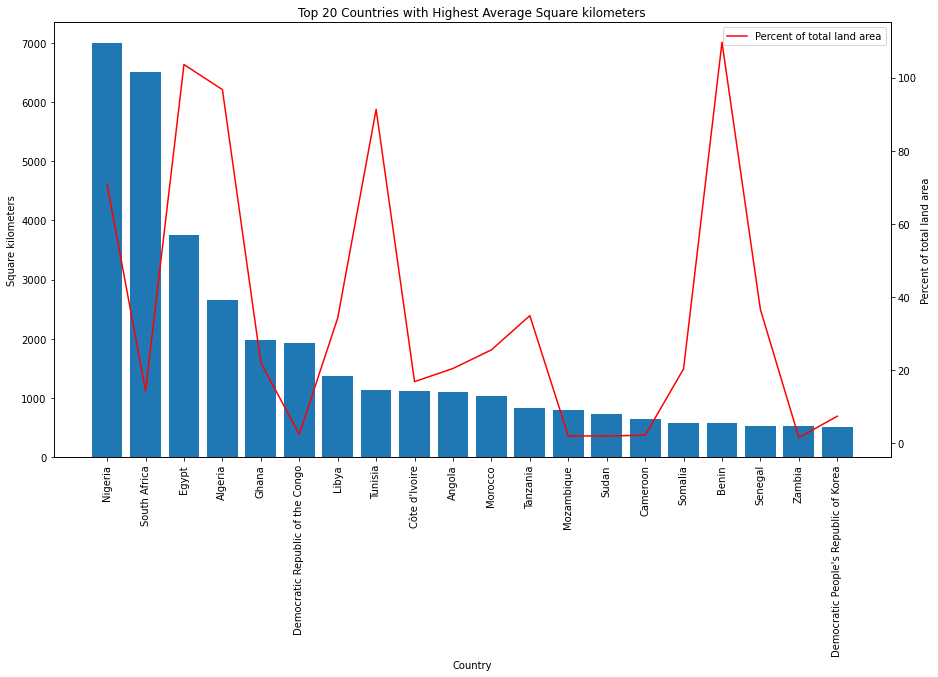

In [23]:
df_top_20 = df_africa_built_up_area_processed.groupby('Country')[['Square kilometers', 'Percent of total land area']].mean().nlargest(20, 'Square kilometers').sort_values(ascending=False,by='Square kilometers').reset_index()

plt.figure(figsize=(15,8))
plt.bar(df_top_20['Country'], df_top_20['Square kilometers'])
plt.title('Top 20 Countries with Highest Average Square kilometers')
plt.ylabel('Square kilometers')
plt.xlabel('Country') 

plt.xticks(rotation=90)
plt.twinx()
plt.plot(df_top_20['Country'], df_top_20['Percent of total land area'], color='red', label='Percent of total land area' )
plt.ylabel('Percent of total land area')

plt.legend()
plt.show() 
  

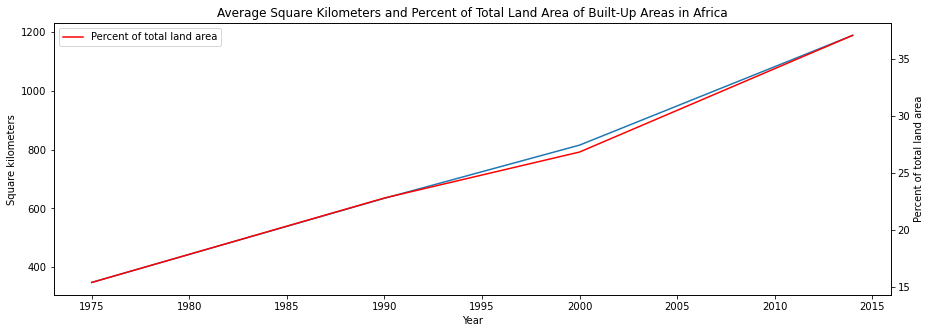

In [24]:
df_top_20 = df_africa_built_up_area_processed.groupby('Year')[['Square kilometers', 'Percent of total land area']].mean().reset_index()

plt.figure(figsize=(15,5))
plt.plot(df_top_20['Year'], df_top_20['Square kilometers'], label='Square kilometers')
plt.title('Average Square Kilometers and Percent of Total Land Area of Built-Up Areas in Africa')
plt.ylabel('Square kilometers')
plt.xlabel('Year')

plt.twinx()
plt.plot(df_top_20['Year'], df_top_20['Percent of total land area'], color='red', label='Percent of total land area')
plt.ylabel('Percent of total land area')

plt.legend() 
plt.show() 



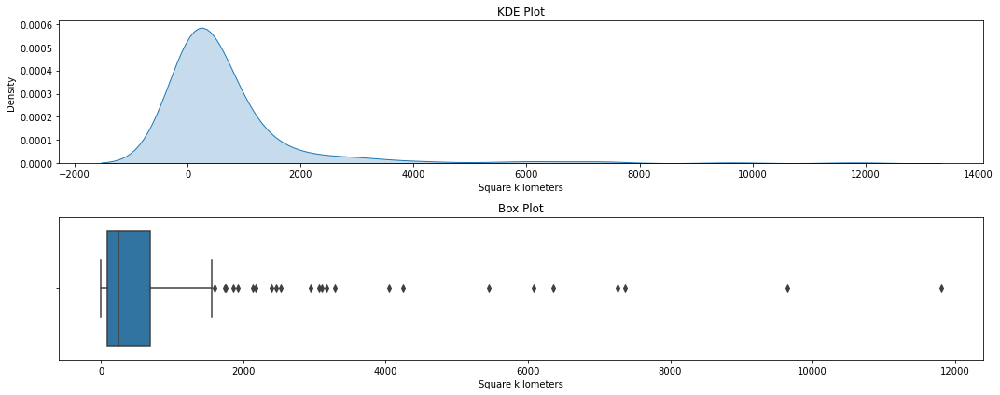

count      221.000000
mean       746.195681
std       1503.462987
min          0.000000
25%         83.431800
50%        249.379200
75%        685.835100
max      11801.974500
Name: Square kilometers, dtype: float64


In [25]:
KDE_Box_plot(df_africa_built_up_area_processed , 'Square kilometers') 
print(df_africa_built_up_area_processed['Square kilometers'].describe()) 

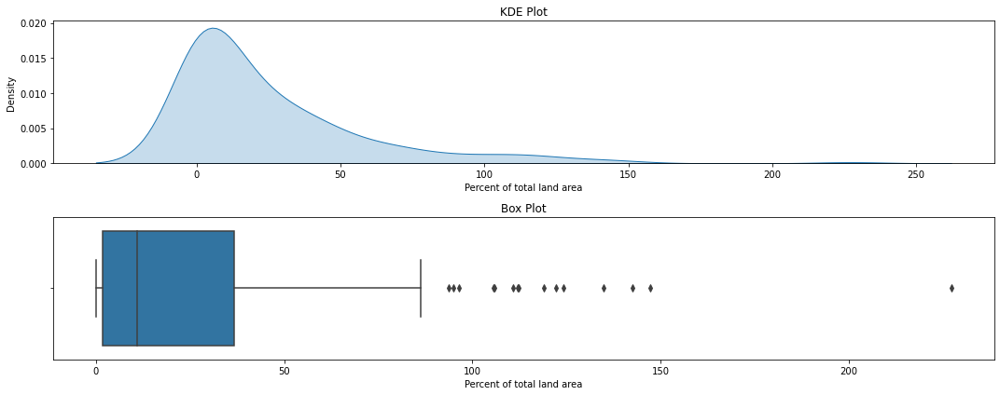

count    224.000000
mean      25.625474
std       34.397360
min        0.000000
25%        1.824174
50%       11.068314
75%       36.806933
max      227.229735
Name: Percent of total land area, dtype: float64


In [26]:
KDE_Box_plot(df_africa_built_up_area_processed , 'Percent of total land area') 
print(df_africa_built_up_area_processed['Percent of total land area'].describe())  

#### african-economic-outlook-january-2019_processed

In [96]:
df_african_economic_outlook_january_2019_processed = pd.read_csv('../../task 2 data preprocessing/processedData/african-economic-outlook-january-2019_processed.csv')
df_african_economic_outlook_january_2019_processed 


,Country,Year,"Central government, Fiscal Balance (% of GDP)","Central government, Fiscal Balance (Current US $)","Central government, total expenditure and net lending (% of GDP)","Central government, total expenditure and net lending (Current US $)","Central government, total revenue and grants (% of GDP)","Central government, total revenue and grants (Current US $)",Current account balance (As % of GDP),"Current account balance (Net, BoP, cur. US$)",...,"Gross capital formation, Public sector (% GDP)","Gross domestic product, (constant prices US$)","Gross domestic product, current prices (current US$)",Household final consumption expenditure (% of GDP),Household final consumption expenditure (current US$),Imports of goods and services (% of GDP),Imports of goods and services (current US$),"Inflation, consumer prices (annual %)",Real GDP growth (annual %),Real per Capita GDP Growth Rate (annual %)
0,Angola,1981,-12.508228,-585.692722,42.791310,2003.685816,30.283082,1417.993094,-3.909387,-183.055463,...,-10.048279,6966.154020,4682.459591,24.049505,1126.108332,34.977558,1637.810014,5386.889918,-4.400001,-7.653439
1,Angola,1982,-13.824884,-647.344606,47.399605,2219.467351,33.574721,1572.122745,-10.559853,-494.460861,...,-10.048279,6966.154020,4682.459591,25.697798,1203.288990,32.122247,1504.111237,5070.756092,0.000000,-3.523727
2,Angola,1983,-7.580545,-369.911302,42.956415,2096.163813,35.375870,1726.252512,-7.362194,-359.256355,...,-8.914389,7258.732588,4879.745710,26.925764,1313.908811,34.933365,1704.659402,4992.825160,4.200001,0.534102
3,Angola,1984,-4.171633,-215.781535,48.867703,2527.726884,44.696070,2311.945349,-3.301075,-170.751126,...,-7.177953,7694.256701,5172.592014,28.432294,1470.686543,36.832744,1905.207567,4842.852179,6.000002,2.433853
4,Angola,1985,-5.790589,-369.017280,43.776483,2789.747277,37.985894,2420.729996,-1.589672,-101.305135,...,5.239836,7963.555646,6372.707708,33.043344,2105.755732,30.945354,1972.056956,4525.631513,3.499999,0.263786
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
475,Tanzania,2016,-2.445048,-1158.669192,18.391053,8715.224558,15.946004,7556.555366,-4.446688,-2107.214000,...,7.751040,29220.269746,47388.393563,64.408436,30522.123338,22.738737,10775.522188,5.174766,7.000000,3.741714
476,Tanzania,2017,-1.240017,-645.923990,17.668749,9203.638231,16.428731,8557.714241,-3.309942,-1724.146464,...,7.708003,31294.908898,52089.927138,63.888846,33279.653500,17.175000,8946.445049,5.318716,7.100000,3.852395
477,Tanzania,2018,-3.927119,-2316.658711,21.131920,12465.994789,17.204801,10149.336078,-3.720296,-2194.651167,...,8.202832,33382.011507,58991.301442,63.960630,37731.207759,18.531459,10931.949131,4.827755,6.669144,3.453489
478,Tanzania,2019,-3.265437,-2103.349491,20.363218,13116.457523,17.097781,11013.108033,-3.389877,-2183.504364,...,9.292206,35597.668582,64412.498175,63.589770,40959.759527,17.861196,11504.842804,5.245073,6.637279,3.447336


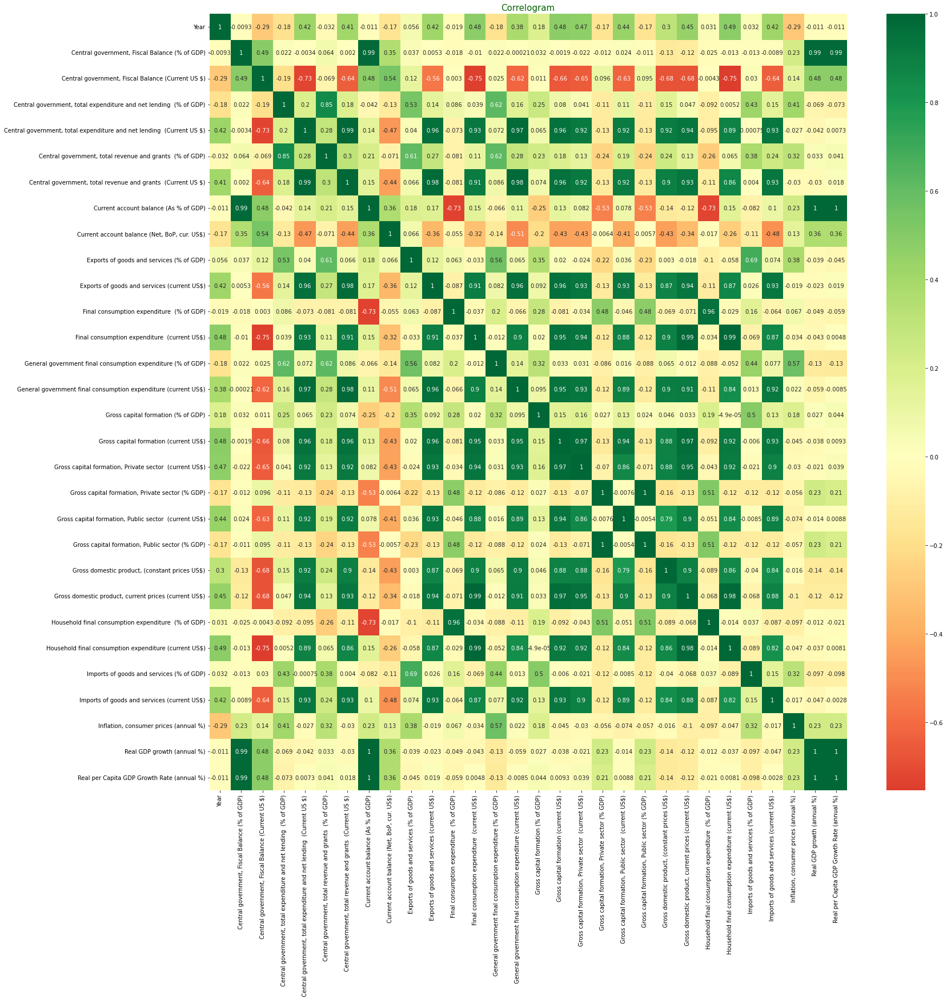

In [99]:
corr = df_african_economic_outlook_january_2019_processed.corr()   
plt.figure(figsize = (25, 25)) 
sns.heatmap(corr, cmap='RdYlGn', annot = True, center = 0)
plt.title('Correlogram', fontsize = 15, color = 'darkgreen')
plt.show()  

a lot of multicollinearity , this is not good for a regression problem 

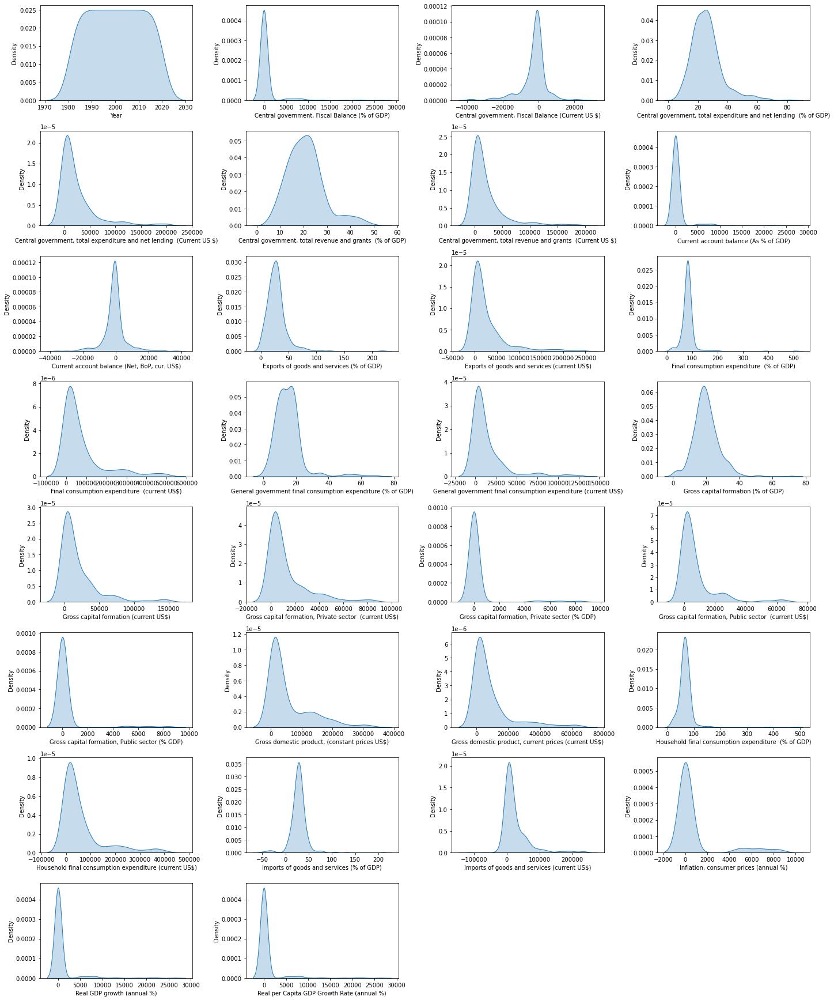

In [106]:
kdeplot_viz(df_african_economic_outlook_january_2019_processed.drop(columns=['Country']) , 4 , 20  )  

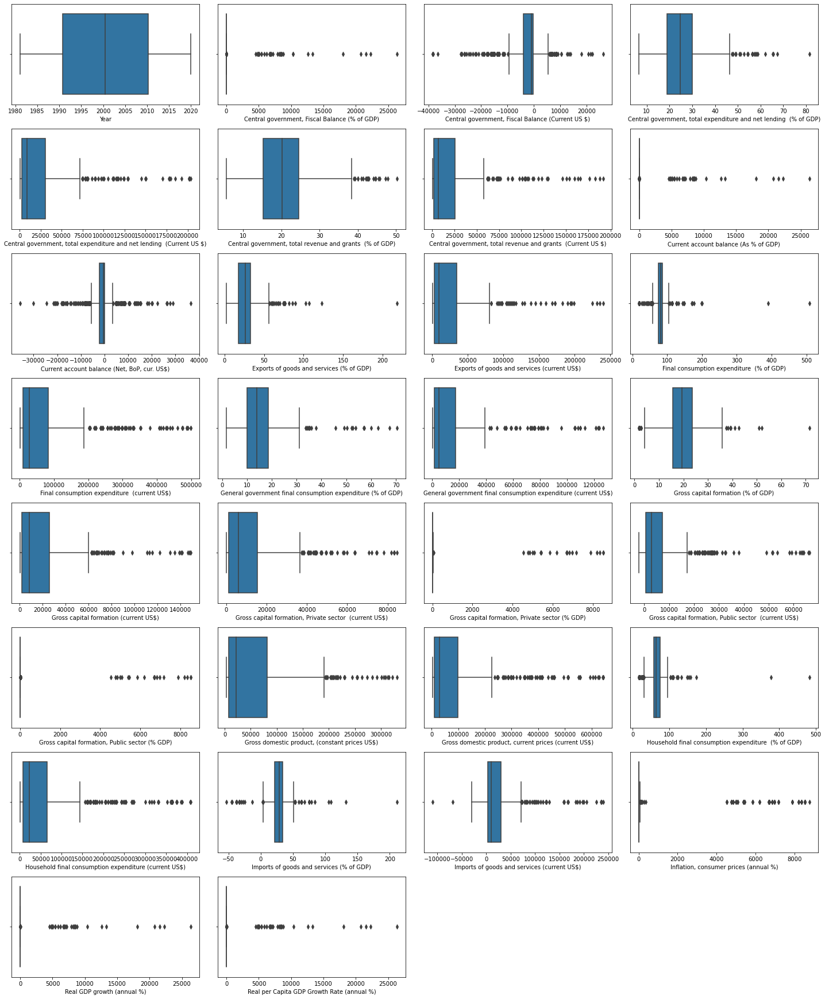

In [126]:
boxplot_viz(df_african_economic_outlook_january_2019_processed.drop(columns=['Country']) , 4 , 20  )  

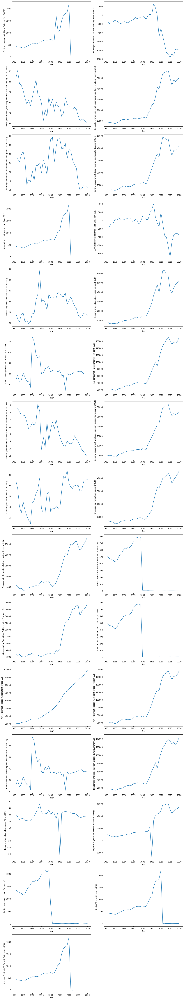

In [125]:
df_grouped =df_african_economic_outlook_january_2019_processed.groupby('Year').mean()
line_plot(df_grouped , 'Year' , 2 , 20)   

Going through a bar plot for top 10 countries will be pointless since there are 30 features , I have gone through a statistical overview checking boxplots and distributions that's enough 

#### Multiple city Population 

In [173]:
# population growth datasets

df_Alexandria_population_processed = pd.read_csv('../../task 2 data preprocessing/processedData/Alexandria population_processed.csv')
df_Antananarivo_population_processed =pd.read_csv('../../task 2 data preprocessing/processedData/Antananarivo population_processed.csv')
df_population_cairo_1950_to_2035_preprocessed = pd.read_csv('../../task 2 data preprocessing/processedData/population-cairo_1950_to_2035_processed.csv')
df_population_dar_es_salaam_1950_to_2035_processed =  pd.read_csv('../../task 2 data preprocessing/processedData/population-dar es salaam_1950_to_2035_processed.csv')
df_population_ekurhuleni_1950_to_2035_processed =  pd.read_csv('../../task 2 data preprocessing/processedData/population-ekurhuleni_1950_to_2035_processed.csv')


# all of these datasets have been merged in a single file called multiple_city_population_from_world_population_review 

df_multiple_city_population_from_world_population_review =  pd.read_csv('../../task 2 data preprocessing/processedData/multiple_city_population_from_world_population_review.csv')
df_multiple_city_population_from_world_population_review.drop(columns=['Unnamed: 0'] , inplace=True)
df_multiple_city_population_from_world_population_review.rename(columns={'country':'Country'},inplace=True)

# apparently there was some error in the Dar es salam data , the country column is null , lets fix it 

df_multiple_city_population_from_world_population_review.loc[df_multiple_city_population_from_world_population_review['city']=='Dar Es Salaam', 'Country'] = 'Tanzania'
df_multiple_city_population_from_world_population_review.Country.value_counts()



Egypt           172
Madagascar       86
Tanzania         86
South Africa     86
Nigeria          86
Name: Country, dtype: int64

In [174]:
df_multiple_city_population_from_world_population_review.head()  

,population_growth,population_growth_rate,population,year,city,Country
0,163737,0.023375,7168583,2035,Alexandria,Egypt
1,156804,0.022898,7004846,2034,Alexandria,Egypt
2,150073,0.022406,6848042,2033,Alexandria,Egypt
3,143349,0.021870,6697969,2032,Alexandria,Egypt
4,137236,0.021385,6554620,2031,Alexandria,Egypt


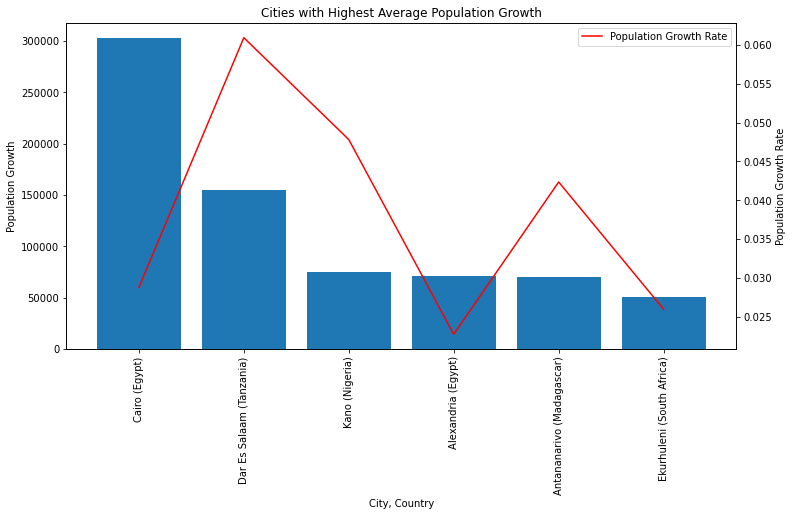

In [178]:
df_top_20 = df_multiple_city_population_from_world_population_review.groupby(['city', 'Country'])[['population_growth', 'population_growth_rate']].mean().sort_values(ascending=False,by='population_growth').reset_index()

df_top_20['city_country'] = df_top_20['city'] + " (" + df_top_20['Country'] + ")"

plt.figure(figsize=(12,6))
plt.bar(df_top_20['city_country'], df_top_20['population_growth'])
plt.title('Cities with Highest Average Population Growth')
plt.ylabel('Population Growth')
plt.xlabel('City, Country')  

plt.xticks(rotation=90)

plt.twinx()
plt.plot(df_top_20['city_country'], df_top_20['population_growth_rate'], color='red', label='Population Growth Rate')
plt.ylabel('Population Growth Rate')

plt.legend()
plt.show() 


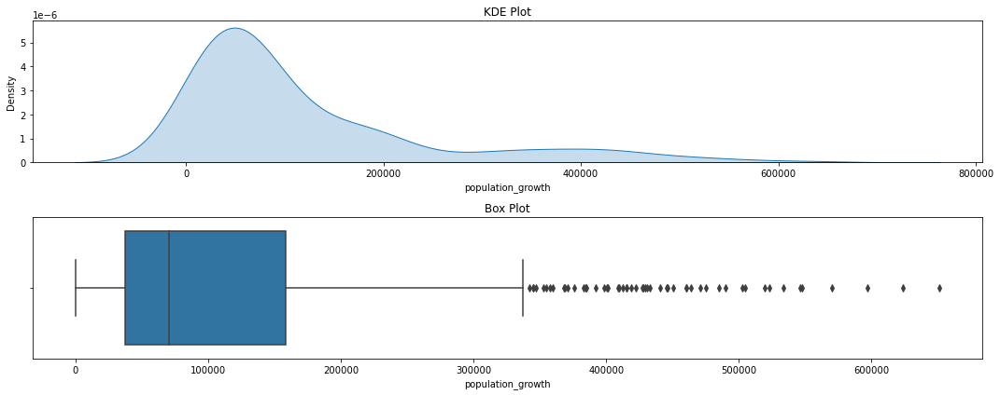

In [193]:
KDE_Box_plot(df_multiple_city_population_from_world_population_review , 'population_growth')

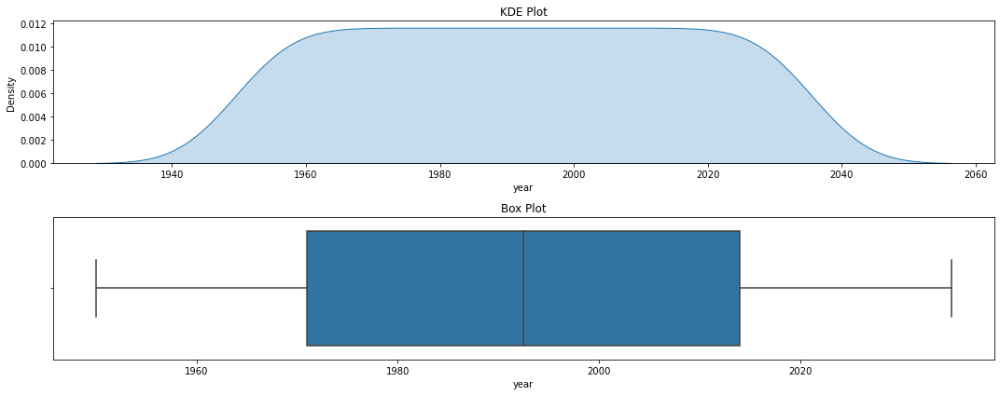

In [186]:
KDE_Box_plot(df_multiple_city_population_from_world_population_review , 'year')

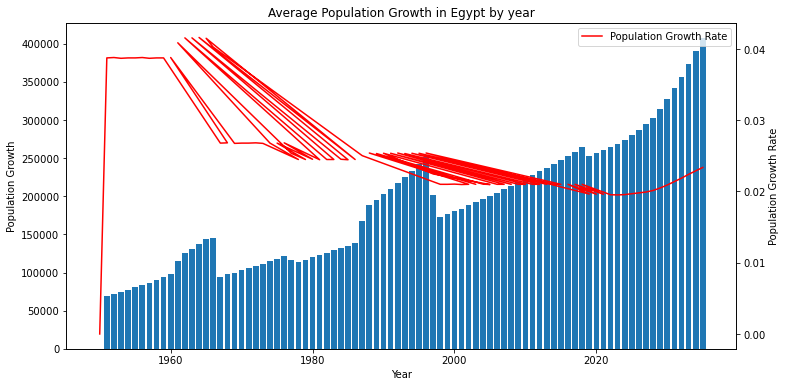

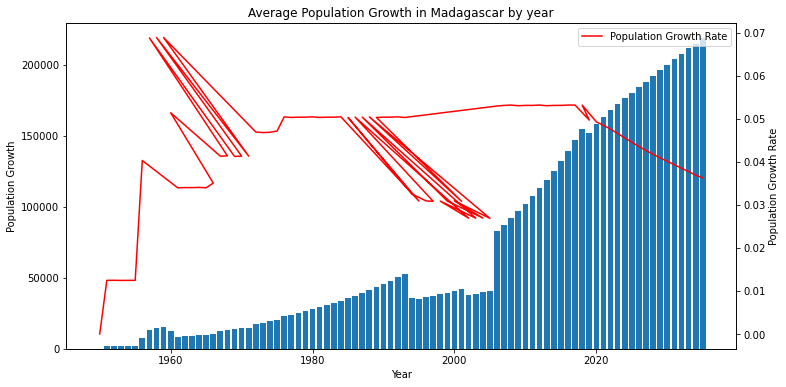

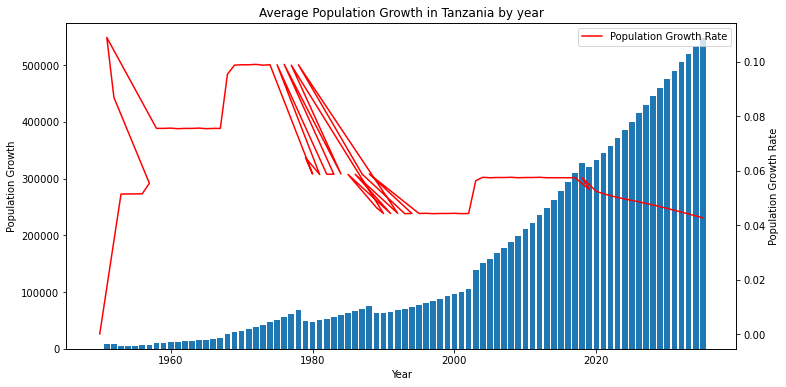

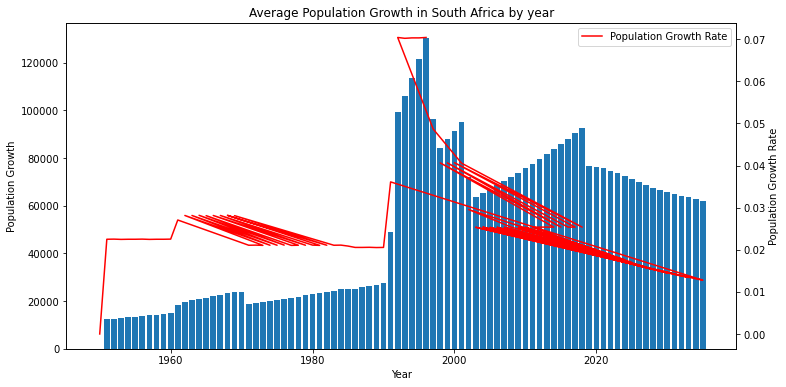

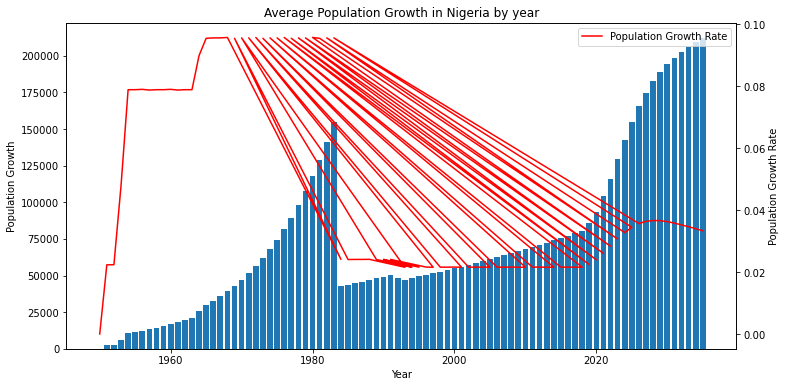

In [192]:
countries = df_multiple_city_population_from_world_population_review['Country'].unique()

for country in countries:
    df_country = df_multiple_city_population_from_world_population_review[df_multiple_city_population_from_world_population_review['Country'] == country]
    df_grouped = df_country.groupby(['year'])[['population_growth', 'population_growth_rate']].mean().sort_values(ascending=False,by='population_growth').reset_index()

    plt.figure(figsize=(12,6))
    plt.bar(df_grouped['year'], df_grouped['population_growth'])
    plt.title(f'Average Population Growth in {country} by year')
    plt.ylabel('Population Growth')
    plt.xlabel('Year')  

    plt.twinx()
    plt.plot(df_grouped['year'], df_grouped['population_growth_rate'], color='red', label='Population Growth Rate')
    plt.ylabel('Population Growth Rate')

    plt.legend()
    plt.show()  


Very weird growth rates tbh 

#### cameroon population change % 2000-2016_processed

In [196]:
df_cameroon_population_change_2000_2016_processed = pd.read_csv('../../task 2 data preprocessing/processedData/cameroon population change % 2000-2016_processed.csv')
df_cameroon_population_change_2000_2016_processed.head()


,Year,Urban population (%),Country
0,2000,45.542,Cameroon
1,2001,46.139,Cameroon
2,2002,46.738,Cameroon
3,2003,47.338,Cameroon
4,2004,47.940,Cameroon


<AxesSubplot:xlabel='Year'>

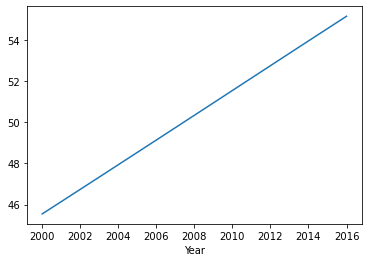

In [199]:
df_cameroon_population_change_2000_2016_processed.groupby('Year')['Urban population (%)'].mean().plot(kind='line')

#### city_building_dataset_preprocessed

In [203]:
df_city_building_dataset_preprocessed = pd.read_csv('../../task 2 data preprocessing/processedData/city_building_dataset_preprocessed.csv')
df_city_building_dataset_preprocessed.drop(columns=['Unnamed: 0','agglosID','ISO3'] , inplace=True)
df_city_building_dataset_preprocessed 

,Agglomeration_Name,x,y,Population_2015,Built_up,Voronoi,Population_1950,Population_1960,Population_1970,Population_1980,...,Area_r750_1000,Perc_Build_r750_1000,Total_BAre_r1000_1500,Min_Height_r1000_1500,Max_Height_r1000_1500,Av_Height_r1000_1500,StD_Height_r1000_1500,Tot_Volume_r1000_1500,Area_r1000_1500,Perc_Build_r1000_1500
0,10 Ramadan,31.741,30.288,158515.0,78.559532,2631.762358,0.00000,0.00000,0.00000,0.00000,...,5.414101e+05,32.790497,467720.8631,4.6,32.4,11.752083,5.411619,5.496695e+06,1.286940e+06,36.343630
1,42nd Hill,29.112,-28.244,17893.0,3.815350,3869.715394,0.00000,0.00000,0.00000,13680.00000,...,6.655809e+05,27.283914,254656.5330,4.3,8.2,4.903145,0.557671,1.248618e+06,1.036789e+06,24.562038
2,Aabudwaaq,46.217,6.251,75100.0,11.501315,4888.693377,0.00000,0.00000,0.00000,0.00000,...,1.355614e+06,21.747340,614916.5938,4.3,9.8,5.106416,0.635964,3.140020e+06,3.533806e+06,17.400973
3,Aadado,46.631,6.137,60300.0,9.946453,9100.946257,0.00000,0.00000,0.00000,0.00000,...,1.357535e+06,21.765007,365078.6197,2.5,10.5,5.101928,0.729294,1.862605e+06,3.349888e+06,10.898234
4,Aasalaya,32.717,13.244,20167.0,4.001538,590.257365,0.00000,0.00000,0.00000,18486.08804,...,3.350554e+05,24.696804,138395.4216,4.3,6.2,5.060920,0.371810,7.004081e+05,6.927145e+05,19.978709
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5620,Zuguma,4.967,9.458,22014.0,2.759142,1717.183863,0.00000,0.00000,0.00000,0.00000,...,2.945337e+05,13.656257,51450.9050,4.3,13.7,5.623684,1.567001,2.893436e+05,3.031546e+05,16.971835
5621,Zungeru,6.153,9.809,16342.0,2.057855,706.941864,0.00000,0.00000,0.00000,0.00000,...,3.998799e+05,15.683786,42232.8804,4.4,9.7,5.463889,0.978421,2.307558e+05,3.709111e+05,11.386255
5622,Zur Abu al-Layl,31.763,30.923,19534.0,1.805516,37.080602,0.00000,0.00000,0.00000,0.00000,...,1.341049e+05,16.553503,111187.1376,2.5,13.2,7.656923,1.929525,8.513514e+05,4.767890e+05,23.319987
5623,Zuru,5.244,11.426,122854.0,15.100421,801.614288,0.00000,0.00000,17000.00000,29000.00000,...,8.569181e+05,34.542470,380261.1581,4.3,14.7,6.117801,1.640361,2.326362e+06,1.470973e+06,25.850989


##### feature description by chatgpt 

Agglomeration_Name: The name of the agglomeration (i.e., a continuous urban area) to which the city belongs.

x, y: The longitude and latitude coordinates of the city.

Population_2015: The population of the city in 2015.

Built_up: The built-up area of the city in square meters.

Voronoi: The area of the Voronoi cell associated with the city.

Population_1950 - Population_2010: The population of the city in each of these years.

Metropole: Whether the city is a metropolis or not.

NBuildings: The number of buildings in the city.

TotalFootprint: The total footprint of buildings in the city in square meters.

AreaConfidence: The confidence interval for the estimated built-up area of the city.

MeanBuildingArea: The mean area of buildings in the city in square meters.

MedianBuildingArea: The median area of buildings in the city in square meters.

VarBuildingArea: The variance in building area in the city in square meters.

AreaBuilt: The proportion of the city's land area that is built-up.

NBranches: The number of branches of the road network in the city.

Polycentrism: A measure of the degree to which the city has multiple centers.

HerfindahlIndex: A measure of the concentration of economic activity within the city.

MeanDistanceBuildings: The mean distance between buildings in the city in meters.

WMeanDistanceBuildings: The weighted mean distance between buildings in the city in meters.

MaxBuildingsDistance: The maximum distance between any two buildings in the city in meters.

CentreLon, CentreLat: The longitude and latitude coordinates of the city center.

CentreDensity: The population density at the city center.

NBuildingsCentre1km: The number of buildings within 1 km of the city center.

TotalFootprintCentre1km: The total footprint of buildings within 1 km of the city center in square meters.

NBuildingsCentre3km: The number of buildings within 3 km of the city center.

TotalFootprintCentre3km: The total footprint of buildings within 3 km of the city center in square meters.

MeanArea0100m - MeanArea3000m: The mean area of buildings within the specified distance from the city center in square meters.

FootpLargeBuildings050m, FootpLargeBuildings100m, FootpLargeBuildings200m: The footprint of large buildings (larger than 50, 100, and 200 square meters, respectively) in the city in square meters.

HasRun: Whether the city has been processed by the urban sprawl model or not.

Region: The region to which the city belongs.

INCOME.2019: The average income of residents of the city in 2019.

IncomeGroup: The income group to which the city belongs (low, medium-low, medium-high, or high).

DistanceRiver: The distance between the city and the nearest river in meters.

DistanceCoast: The distance between the city and the nearest coastline in meters.

NearestWaterbody: The distance between the city and the nearest water body (river, lake, or sea) in meters.

BorderDistance: The distance between the city and the nearest border in kilometers.

Capital: Whether the city is a national or regional capital or not.

avg_elev_m, max_elev_m, min_elev_m

#### country_agriculture_land_use_1970-2022_processed 

In [239]:
df_country_agriculture_land_use_1970_2022_processed = pd.read_csv('../../task 2 data preprocessing/processedData/country_agriculture_land_use_1970-2022_processed.csv')
df_country_agriculture_land_use_1970_2022_processed   

,Country,Year,Agricultural Area (in Thousands),"Agricultural Area, % of Land Area","Agricultural Area, per Rural Population","Agricultural Products, Exports (in Thousands)","Agricultural Products, Exports, % of Total","Agricultural Products, Imports (in Thousands)","Agricultural Products, Imports, % of Total","Agricultural Products, Net Exports (in Thousands)",...,"Sorghum, Production","Sorghum, Production, per Person","Sorghum, Yield, per Hectare",Surface Area,Total Agricultural Water Managed Area (in Thousands),"Water Withdrawal, Agricultural, % of Total Water Withdrawal","Wheat, Area Harvested","Wheat, Production","Wheat, Production, per Person","Wheat, Yield, per Hectare"
0,Algeria,1970,44216.0000,18.5646,5.2975,199067.0000,11.8630,168749.0000,30318.0000,17.4500,...,1696.0000,0.1229,8565.6566,2381740.0000,,,2296960.0000,1434548.0000,103.9829,6245.4200
1,Algeria,1971,45433.0000,19.0756,5.3366,107658.0000,14.5094,204519.0000,-96861.0000,10.9127,...,1319.0000,0.0935,6978.8360,2381740.0000,,,2148070.0000,1317392.0000,93.3658,6132.9100
2,Algeria,1972,45396.0000,19.0600,5.2250,124460.0000,17.2844,299880.0000,-175420.0000,8.5227,...,1492.0000,0.1033,10733.8130,2381740.0000,,,2471160.0000,1655854.0000,114.6713,6700.7155
3,Algeria,1973,44304.0000,18.6015,4.9935,229329.0000,13.6641,377482.0000,-148153.0000,9.7821,...,3081.0000,0.2084,13878.3784,2381740.0000,,,2346900.0000,1158077.0000,78.3225,4934.4966
4,Algeria,1974,44336.0000,18.6150,4.8896,168259.0000,17.2224,808416.0000,-640157.0000,3.2940,...,1177.0000,0.0777,7794.7020,2381740.0000,,,2200950.0000,1091111.0000,72.0015,4957.4547
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1320,Uganda,2018,14415.0000,71.8881,0.4555,1615641.8400,10.9500,797736.9700,817904.8700,34.3116,...,268493.0000,6.4674,9498.6963,241550.0000,64.4900,40.6600,14842.0000,23206.0000,0.5590,15635.3591
1321,Uganda,2019,14415.0000,71.8881,0.4437,1435738.2000,11.8940,818072.7100,617665.4900,31.6983,...,97000.0000,2.2585,9219.6559,241550.0000,64.4900,40.6600,15396.0000,24000.0000,0.5588,15588.4645
1322,Uganda,2020,14415.0000,71.8881,0.4326,1522627.8400,10.8550,940349.8800,582277.9600,33.3217,...,162000.0000,3.6482,8979.3973,241550.0000,,,16117.0000,25000.0000,0.5630,15511.5716
1323,Uganda,2021,,,,1279028.8200,,977457.4500,301571.3700,,...,200000.0000,4.3617,8739.1580,,,,16198.0000,25000.0000,0.5452,15434.0042


In [240]:
df_country_agriculture_land_use_1970_2022_processed.info() 

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1325 entries, 0 to 1324
Columns: 106 entries, Country to Wheat, Yield, per Hectare
dtypes: int64(1), object(105)
memory usage: 1.1+ MB


In [241]:
for col in df_country_agriculture_land_use_1970_2022_processed.drop(columns=['Country']).columns:
    print(df_country_agriculture_land_use_1970_2022_processed[col].dtype)


int64
object
object
object
object
object
object
object
object
object
object
object
object
object
object
object
object
object
object
object
object
object
object
object
object
object
object
object
object
object
object
object
object
object
object
object
object
object
object
object
object
object
object
object
object
object
object
object
object
object
object
object
object
object
object
object
object
object
object
object
object
object
object
object
object
object
object
object
object
object
object
object
object
object
object
object
object
object
object
object
object
object
object
object
object
object
object
object
object
object
object
object
object
object
object
object
object
object
object
object
object
object
object
object
object


In [242]:
import pandas as pd

for col in df_country_agriculture_land_use_1970_2022_processed.drop(columns=['Country']).columns:
    df_country_agriculture_land_use_1970_2022_processed[col] = pd.to_numeric(df_country_agriculture_land_use_1970_2022_processed[col], errors='coerce').astype(float)


In [243]:
for col in df_country_agriculture_land_use_1970_2022_processed.drop(columns=['Country']).columns:
    print(df_country_agriculture_land_use_1970_2022_processed[col].dtype) 


float64
float64
float64
float64
float64
float64
float64
float64
float64
float64
float64
float64
float64
float64
float64
float64
float64
float64
float64
float64
float64
float64
float64
float64
float64
float64
float64
float64
float64
float64
float64
float64
float64
float64
float64
float64
float64
float64
float64
float64
float64
float64
float64
float64
float64
float64
float64
float64
float64
float64
float64
float64
float64
float64
float64
float64
float64
float64
float64
float64
float64
float64
float64
float64
float64
float64
float64
float64
float64
float64
float64
float64
float64
float64
float64
float64
float64
float64
float64
float64
float64
float64
float64
float64
float64
float64
float64
float64
float64
float64
float64
float64
float64
float64
float64
float64
float64
float64
float64
float64
float64
float64
float64
float64
float64


In [249]:
pd.set_option('display.max_columns', 160) 
df_country_agriculture_land_use_1970_2022_processed.describe()

,Year,Agricultural Area (in Thousands),"Agricultural Area, % of Land Area","Agricultural Area, per Rural Population","Agricultural Products, Exports (in Thousands)","Agricultural Products, Exports, % of Total","Agricultural Products, Imports (in Thousands)","Agricultural Products, Imports, % of Total","Agricultural Products, Net Exports (in Thousands)","Agricultural Raw Materials, Exports","Agricultural Raw Materials, Exports, % of Total","Agricultural Raw Materials, Imports","Agricultural Raw Materials, Imports, % of Total","Agricultural Raw Materials, Net Exports","Agriculture, Share in Total Value Added (Current Prices)","Agriculture, Value Added, Constant 2015 Prices","Agriculture, Value Added, Current Prices","Animal and Vegetable Oils, Fats and Waxes (SITC Section 4), Exports","Animal and Vegetable Oils, Fats and Waxes (SITC Section 4), Exports, % of Total","Animal and Vegetable Oils, Fats and Waxes (SITC Section 4), Imports","Animal and Vegetable Oils, Fats and Waxes (SITC Section 4), Imports, % of Total","Animal and Vegetable Oils, Fats and Waxes (SITC Section 4), Net Exports",Aquatic Species Caught,Arable Land Area (in Thousands),"Arable Land Area, % of Agricultural Area","Arable Land Area, % of Land Area","Arable Land Area, per Rural Population","Area Equipped for Full Control Irrigation, Total (in Thousands)","Area Equipped for Irrigation, Total (in Thousands)","Area Equipped for Irrigation, Total, % of Agricultural Area","Area Equipped for Irrigation, Total, % of Land Area","Area Equipped for Irrigation, Total, per Rural Population","Barley, Area Harvested","Barley, Production","Barley, Production, per Person","Barley, Yield, per Hectare","Cereals, Area Harvested","Cereals, Production","Cereals, Production, per Person","Cereals, Yield, per Hectare","Cotton, Area Harvested","Cotton, Production (in Thousands)","Cotton, Production, per Person","Cotton, Yield, per Hectare","Employment in Agriculture, % of Total Employment","Fertilizers, Nitrogen Nutrients, Agricultural Use","Fertilizers, Phosphate Nutrients, Agricultural Use","Fertilizers, Potash Nutrients, Agricultural Use","Fertilizers, Total Nutrients, Agricultural Use",Food Production Index (2004-2006=100),"Food and Live Animals (SITC Section 0), Exports","Food and Live Animals (SITC Section 0), Exports, % of Total","Food and Live Animals (SITC Section 0), Imports","Food and Live Animals (SITC Section 0), Imports, % of Total","Food and Live Animals (SITC Section 0), Net Exports",Land Area (in Thousands),Land under Permanent Crops (in Thousands),"Land under Permanent Crops, % of Agricultural Area","Land under Permanent Crops, % of Land Area","Land under Permanent Crops, per Rural Population",Land under Permanent Meadows and Pastures (in Thousands),"Land under Permanent Meadows and Pastures, % of Agricultural Area","Land under Permanent Meadows and Pastures, % of Land Area","Land under Permanent Meadows and Pastures, per Rural Population","Maize, Area Harvested","Maize, Production","Maize, Production, per Person","Maize, Yield, per Hectare","Meat, Production","Meat, Production, per Person","Millet, Area Harvested","Millet, Production","Millet, Production, per Person","Millet, Yield, per Hectare","Oil-Seeds and Oleaginous Fruits (SITC Division 22), Exports","Oil-Seeds and Oleaginous Fruits (SITC Division 22), Exports, % of Total","Oil-Seeds and Oleaginous Fruits (SITC Division 22), Imports","Oil-Seeds and Oleaginous Fruits (SITC Division 22), Imports, % of Total","Oil-Seeds and Oleaginous Fruits (SITC Division 22), Net Exports","Primary Fruits, Area Harvested","Primary Fruits, Production","Primary Fruits, Production, per Person","Primary Fruits, Yield, per Hectare","Primary Vegetables, Area Harvested","Primary Vegetables, Production","Primary Vegetables, Production, per Person","Primary Vegetables, Yield, per Hectare","Rice, Area Harvested","Rice, Production","Rice, Production, per Person","Rice, Yield, per Hectare",SDG 02.0a.01 Agriculture Orientation Index for Gover

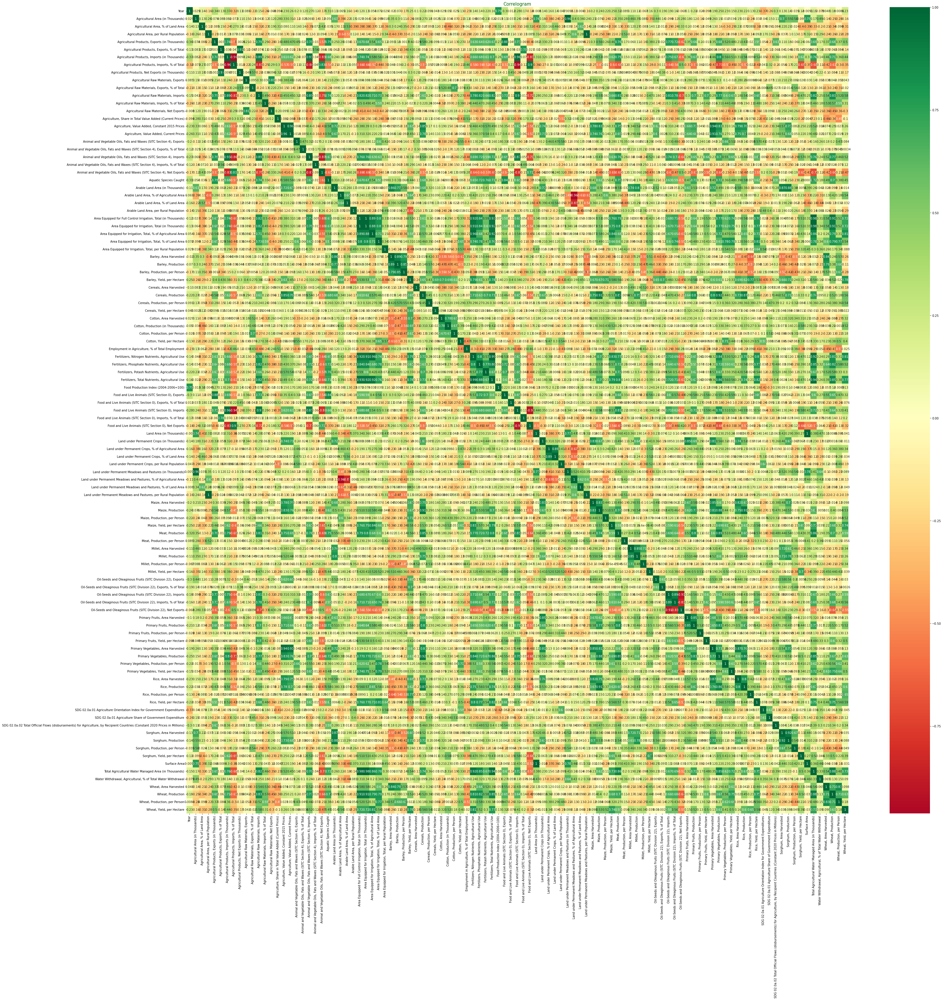

In [251]:
corr = df_country_agriculture_land_use_1970_2022_processed.corr()   
plt.figure(figsize = (50, 50))  
sns.heatmap(corr, cmap='RdYlGn', annot = True, center = 0) 
plt.title('Correlogram', fontsize = 15, color = 'darkgreen')
plt.show()   

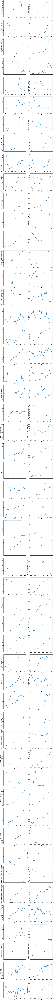

In [252]:
df_grouped =df_country_agriculture_land_use_1970_2022_processed.groupby('Year').mean()
line_plot(df_grouped , 'Year' , 2 , 80)    

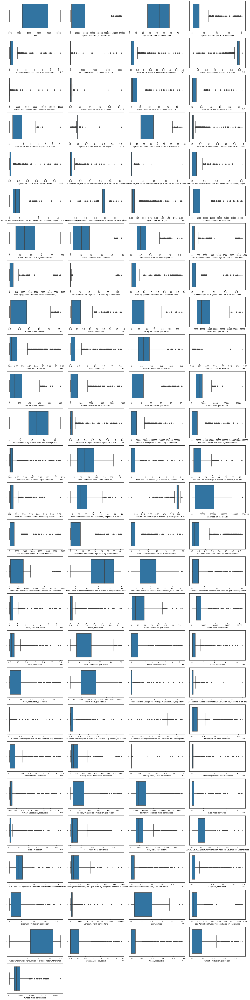

In [254]:
boxplot_viz(df_country_agriculture_land_use_1970_2022_processed.drop(columns=['Country']) , 4 , 60)

Recap : needs a looooooooooooot of feature selection 

#### kenya-populationland-area-population-density_by_subcounty_2019_preprocessed 

Note : this data is the same for this file : population_density_kenya_2009_processed - except it's for 2009 

so no need to do the same process again , it's just a different year . 

it should be concatenated 



In [3]:
df_kenya_populationland_area_population_density_by_subcounty_2019_preprocessed =pd.read_csv('../../task 2 data preprocessing/processedData/kenya-populationland-area-population-density_by_subcounty_2019_preprocessed.csv')
df_kenya_populationland_area_population_density_by_subcounty_2019_preprocessed.drop(columns=['Unnamed: 0'],inplace=True)
df_kenya_populationland_area_population_density_by_subcounty_2019_preprocessed 


,city,Population,Land Area (Sq. Km),Population Density (No. per Sq. Km),country,year
0,Mombasa,1208333,219.9,5495,Kenya,2019
1,Changamwe,131882,17.7,7457,Kenya,2019
2,Jomvu,163415,36.9,4432,Kenya,2019
3,Kisauni,291930,87.7,3328,Kenya,2019
4,Likoni,250358,40.5,6187,Kenya,2019
...,...,...,...,...,...,...
390,Makadara,189536,11.7,16150,Kenya,2019
391,Mathare,206564,3.0,68941,Kenya,2019
392,Njiru,626482,129.9,4821,Kenya,2019
393,Starehe,210423,20.6,10205,Kenya,2019


In [6]:
df_kenya_populationland_area_population_density_by_subcounty_2019_preprocessed.year.value_counts()

2019    395
Name: year, dtype: int64

In [4]:
df_kenya_populationland_area_population_density_by_subcounty_2019_preprocessed.Population.sum()

95128592

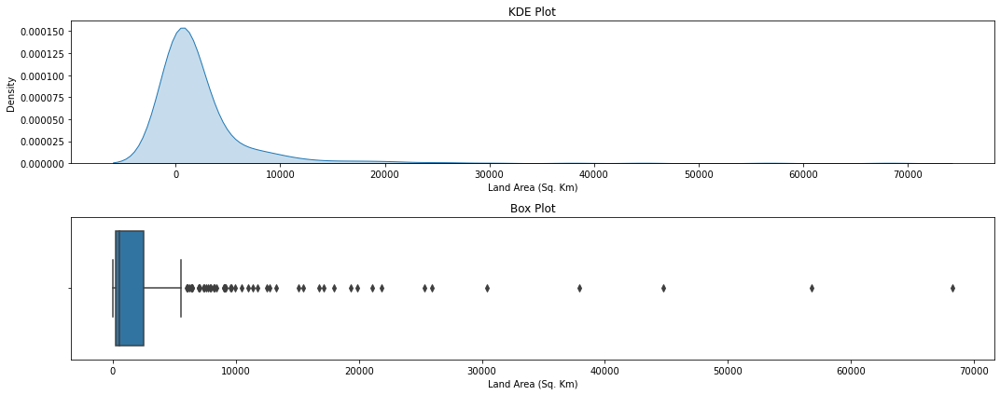

In [257]:
KDE_Box_plot(df_kenya_populationland_area_population_density_by_subcounty_2019_preprocessed ,'Land Area (Sq. Km)' )  

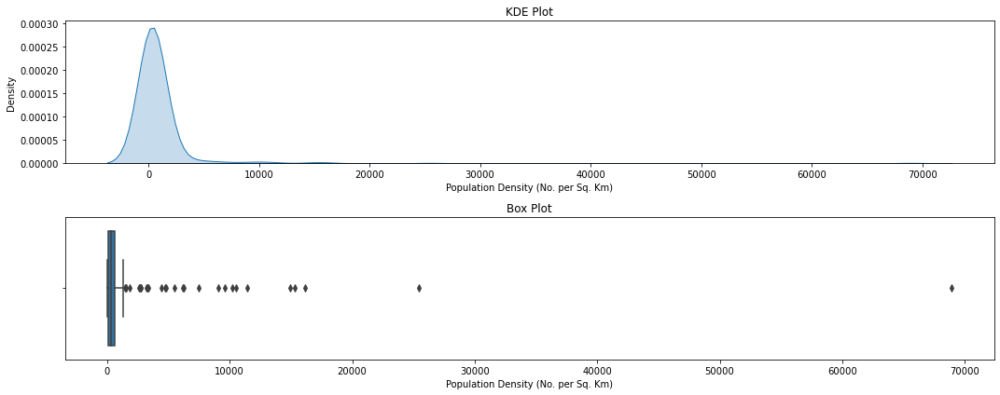

In [258]:
KDE_Box_plot(df_kenya_populationland_area_population_density_by_subcounty_2019_preprocessed ,'Population Density (No. per Sq. Km)' )


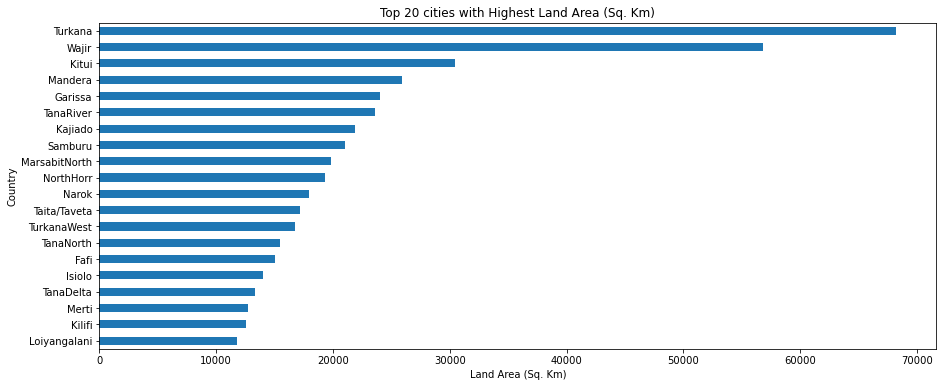

In [267]:
df_kenya_populationland_area_population_density_by_subcounty_2019_preprocessed.groupby('city')['Land Area (Sq. Km)' ].mean().nlargest(20).sort_values().plot(kind='barh' ,figsize=(15,6) )
plt.title('Top 20 cities with Highest Land Area (Sq. Km)')
plt.xlabel('Land Area (Sq. Km)')
plt.ylabel('Country')  
plt.show() 



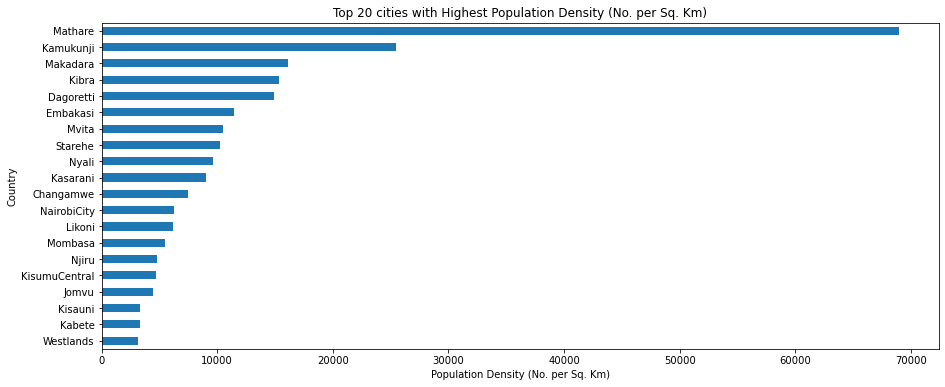

In [271]:
df_kenya_populationland_area_population_density_by_subcounty_2019_preprocessed.groupby('city')['Population Density (No. per Sq. Km)' ].mean().nlargest(20).sort_values().plot(kind='barh' ,figsize=(15,6) )
plt.title('Top 20 cities with Highest Population Density (No. per Sq. Km)')
plt.xlabel('Population Density (No. per Sq. Km)')
plt.ylabel('Country') 
plt.show() 

#### kinshasa_douala_luanda_nairobi_population_processed 

In [3]:
df_kinshasa_douala_luanda_nairobi_population_processed =pd.read_csv('../../task 2 data preprocessing/processedData/kinshasa_douala_luanda_nairobi_population_processed.csv')
df_kinshasa_douala_luanda_nairobi_population_processed  


,Population,annual population change %,Year,City,Country
0,202000,5.54,1950,Kinshasa,Democratic Republic of Congo
1,217000,7.43,1951,Kinshasa,Democratic Republic of Congo
2,234000,7.83,1952,Kinshasa,Democratic Republic of Congo
3,252000,7.69,1953,Kinshasa,Democratic Republic of Congo
4,272000,7.94,1954,Kinshasa,Democratic Republic of Congo
...,...,...,...,...,...
339,7309000,3.95,2031,Nairobi,Kenya
340,7594000,3.90,2032,Nairobi,Kenya
341,7888000,3.87,2033,Nairobi,Kenya
342,8190000,3.83,2034,Nairobi,Kenya


In [8]:
df_kinshasa_douala_luanda_nairobi_population_processed.City.value_counts()

Kinshasa    86
Douala      86
Luanda      86
Nairobi     86
Name: City, dtype: int64

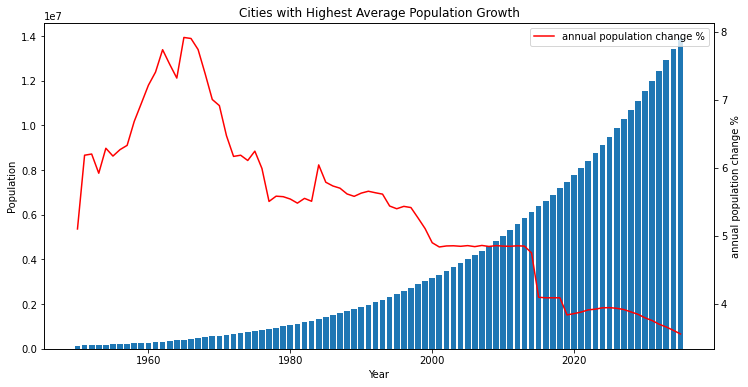

In [7]:
df_grouped = df_kinshasa_douala_luanda_nairobi_population_processed.groupby(['Year'])[['Population', 'annual population change %']].mean().sort_values(ascending=False,by='Population').reset_index()

plt.figure(figsize=(12,6))
plt.bar(df_grouped['Year'], df_grouped['Population'])
plt.title('Cities with Highest Average Population Growth')
plt.ylabel('Population')
plt.xlabel('Year')  


plt.twinx()
plt.plot(df_grouped['Year'], df_grouped['annual population change %'], color='red', label='annual population change %')
plt.ylabel('annual population change %')

plt.legend()
plt.show()

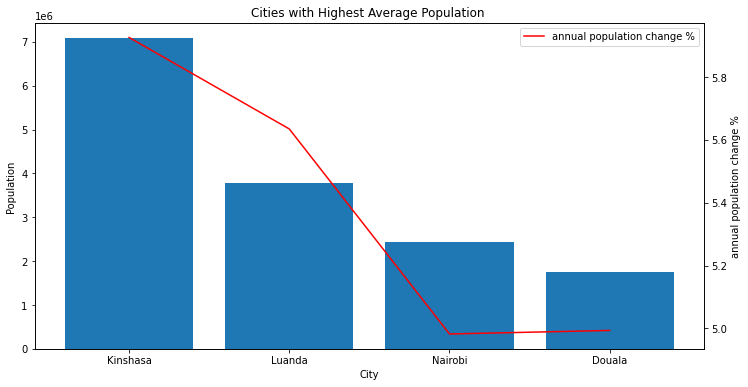

In [12]:
df_top_20 = df_kinshasa_douala_luanda_nairobi_population_processed.groupby(['City'])[['Population', 'annual population change %']].mean().sort_values(ascending=False,by='Population').reset_index()

plt.figure(figsize=(12,6))
plt.bar(df_top_20['City'], df_top_20['Population'])
plt.title('Cities with Highest Average Population ')
plt.ylabel('Population ')
plt.xlabel('City')  

plt.twinx()
plt.plot(df_top_20['City'], df_top_20['annual population change %'], color='red', label='annual population change %')
plt.ylabel('annual population change %')

plt.legend()
plt.show()

#### real_gdp_growth_preprocessed

This data was found as a column in another dataset above , but nevertheless let's do a quick viz 

In [30]:
df_real_gdp_growth_preprocessed =pd.read_csv('../../task 2 data preprocessing/processedData/real-gdp-growth-preprocessed.csv')
df_real_gdp_growth_preprocessed.drop(columns=['Unnamed: 0'],inplace=True)
df_real_gdp_growth_preprocessed   

,Country,Year,real_gdp
0,Algeria,1980,-5.400
1,Algeria,1981,3.000
2,Algeria,1982,6.400
3,Algeria,1983,5.400
4,Algeria,1984,5.600
...,...,...,...
2227,Zimbabwe,2023,2.844
2228,Zimbabwe,2024,2.892
2229,Zimbabwe,2025,2.948
2230,Zimbabwe,2026,2.958


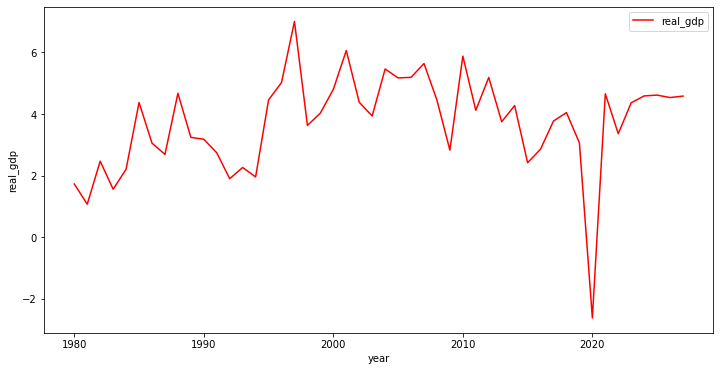

In [36]:
df_grouped = df_real_gdp_growth_preprocessed.groupby(['Year'])[['real_gdp']].mean().reset_index()

plt.figure(figsize=(12,6))
 
plt.plot(df_grouped['Year'], df_grouped['real_gdp'], color='red', label='real_gdp')
plt.ylabel('real_gdp')
plt.xlabel('year')

plt.legend()
plt.show()

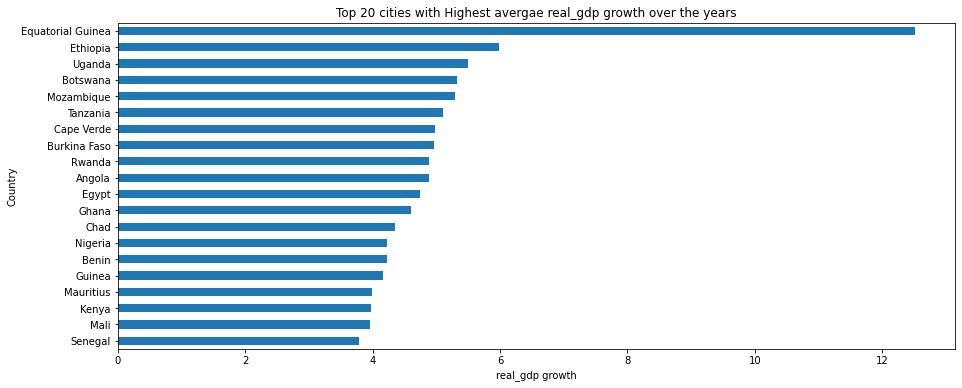

In [39]:
df_real_gdp_growth_preprocessed.groupby('Country')['real_gdp' ].mean().nlargest(20).sort_values().plot(kind='barh' ,figsize=(15,6) )
plt.title('Top 20 cities with Highest avergae real_gdp growth over the years')
plt.xlabel('real_gdp growth')
plt.ylabel('Country')   
plt.show()  

#### tanzania, egypt, south africa, madagascar and angola pop data 1955 to 2050 preprocess 

In [41]:
df_tanzania_egypt_south_africa_madagascar_angola_1955_2050_preprocess =pd.read_csv('../../task 2 data preprocessing/processedData/tanzania, egypt, south africa, madagascar and angola pop data 1955 to 2050 preprocess.csv')
df_tanzania_egypt_south_africa_madagascar_angola_1955_2050_preprocess.drop(columns=['Unnamed: 0'] ,inplace=True )
df_tanzania_egypt_south_africa_madagascar_angola_1955_2050_preprocess 


,Year,Population,Yearly %,Yearly,Migrants (net),Median Age,Fertility Rate,Density (P/Km²),Urban (Pop %),Urban Population,Country's Share of World Pop,World Population,Global Rank,Country
0,2050,129386839.0,2.28,2758164.0,-22554,22.3,4.92,146.0,59.2,76542196.0,1.33,9.735034e+09,15,Tanzania
1,2045,115596020.0,2.42,2601898.0,-40154,21.5,4.92,130.0,55.7,64407122.0,1.22,9.481803e+09,15,Tanzania
2,2040,102586529.0,2.56,2434187.0,-40132,20.7,4.92,116.0,52.2,53579195.0,1.12,9.198847e+09,17,Tanzania
3,2035,90415596.0,2.69,2250574.0,-40116,20.0,4.92,102.0,48.7,44000950.0,1.02,8.887524e+09,19,Tanzania
4,2030,79162725.0,2.81,2045712.0,-40102,19.3,4.92,89.0,44.9,35529056.0,0.93,8.548487e+09,20,Tanzania
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
103,1975,7556026.0,2.82,195944.0,-3800,17.0,7.20,13.0,16.3,1234215.0,0.19,4.079481e+09,67,Madagascar
104,1970,6576305.0,2.65,161417.0,-1600,17.2,7.30,11.0,14.1,927259.0,0.18,3.700437e+09,68,Madagascar
105,1965,5769218.0,2.50,133969.0,0,17.9,7.30,10.0,12.4,714199.0,0.17,3.339584e+09,73,Madagascar
106,1960,5099373.0,2.34,111166.0,0,19.2,7.30,9.0,10.6,542656.0,0.17,3.034950e+09,73,Madagascar


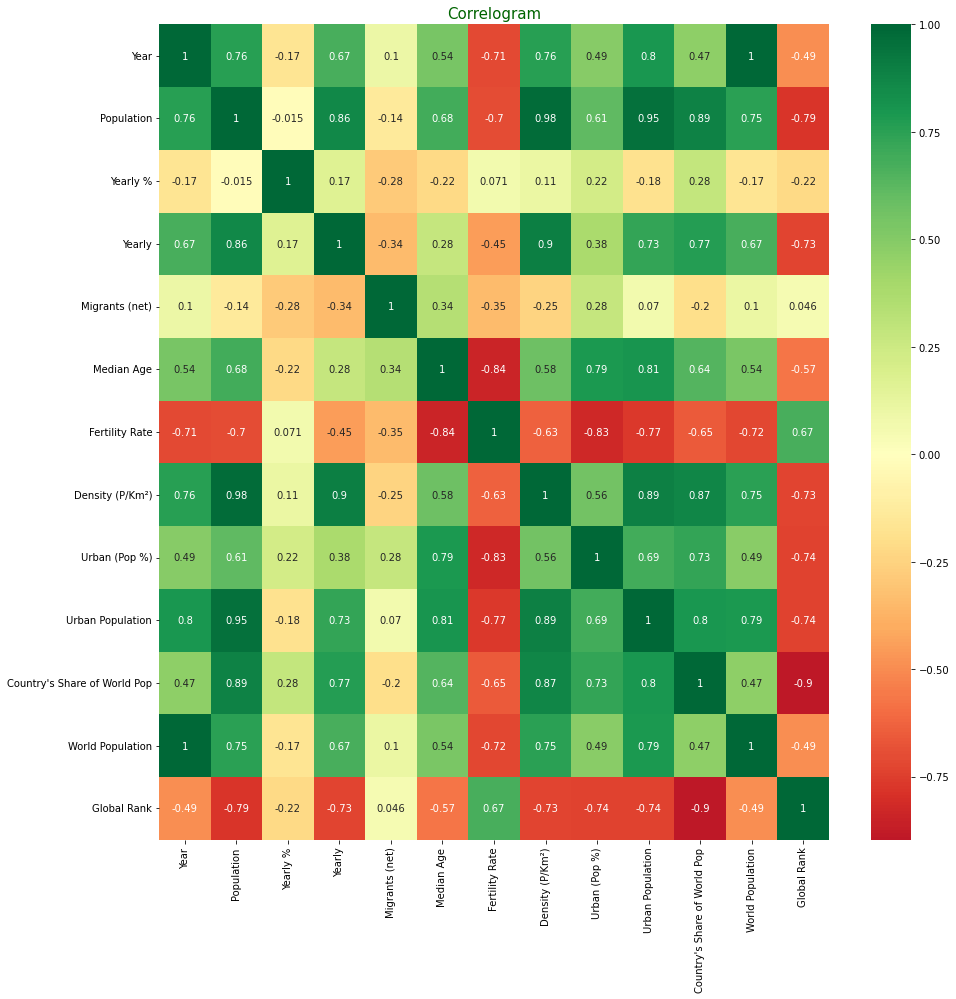

In [48]:
corr = df_tanzania_egypt_south_africa_madagascar_angola_1955_2050_preprocess.corr()   
plt.figure(figsize = (15, 15))   
sns.heatmap(corr, cmap='RdYlGn', annot = True, center = 0) 
plt.title('Correlogram', fontsize = 15, color = 'darkgreen')
plt.show()  

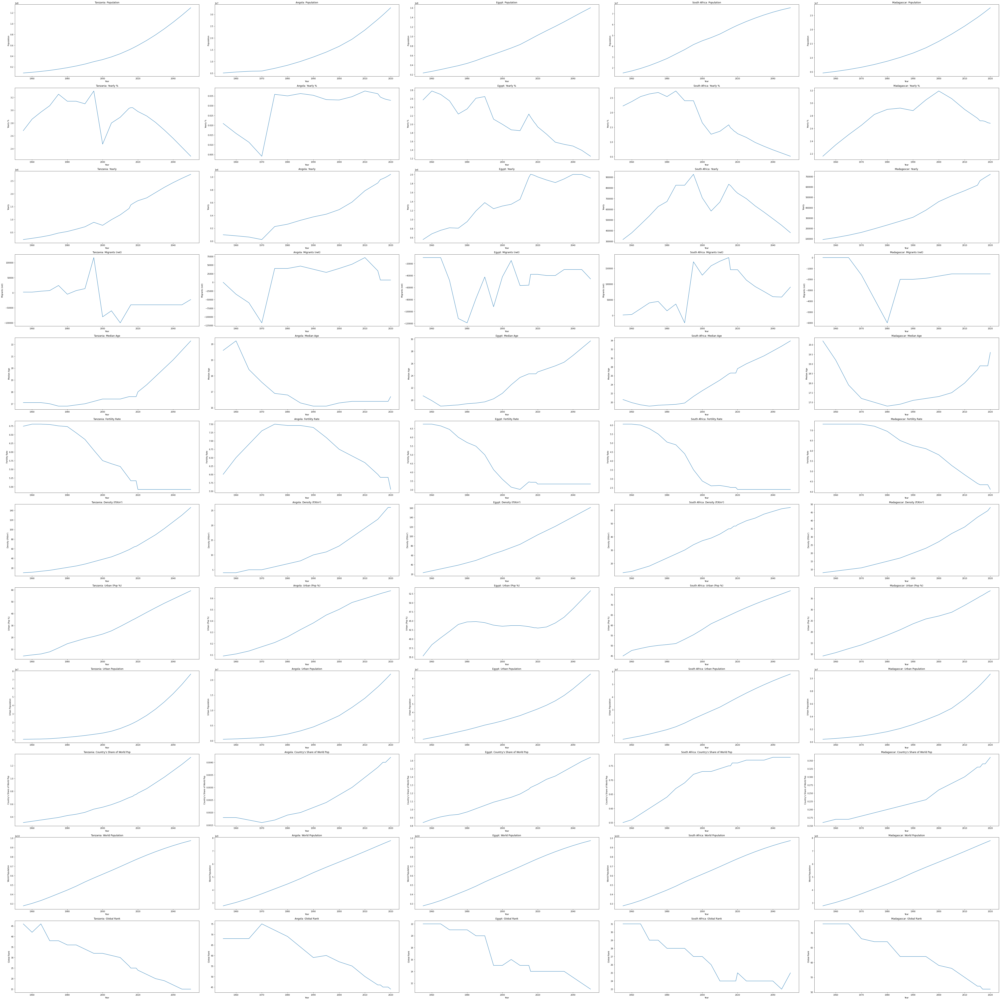

In [59]:
countries = df_tanzania_egypt_south_africa_madagascar_angola_1955_2050_preprocess.Country.unique()
features = df_tanzania_egypt_south_africa_madagascar_angola_1955_2050_preprocess.drop(columns=['Year','Country']).columns

fig, axes = plt.subplots(len(features), len(countries), figsize=(70, 70))

for i, feature in enumerate(features):
    for j, country in enumerate(countries):
        
        df_country = df_tanzania_egypt_south_africa_madagascar_angola_1955_2050_preprocess[df_tanzania_egypt_south_africa_madagascar_angola_1955_2050_preprocess['Country'] == country]
        df_feature = df_country[['Year', feature]].dropna()
        
        ax = axes[i, j]
        ax.plot(df_feature['Year'], df_feature[feature])
        ax.set_title(f'{country}: {feature}')
        ax.set_xlabel('Year')
        ax.set_ylabel(feature) 
        
plt.tight_layout()
plt.show()

In [60]:
# countries = df_tanzania_egypt_south_africa_madagascar_angola_1955_2050_preprocess['Country'].unique()

# for country in countries:
#     df_country = df_tanzania_egypt_south_africa_madagascar_angola_1955_2050_preprocess[df_tanzania_egypt_south_africa_madagascar_angola_1955_2050_preprocess['Country'] == country]
    
#     for col in df_country.drop(columns=['Year','Country']).columns : 

#         df_grouped = df_country.groupby(['Year'])[[col]].mean().reset_index()

#         plt.figure(figsize=(12,6)) 
#         plt.plot(df_grouped['Year'], df_grouped[col])
#         plt.title(f'Average {col} in {country} by year')
#         plt.ylabel(f'{col}')
#         plt.xlabel('Year')  
    
#         plt.show() 

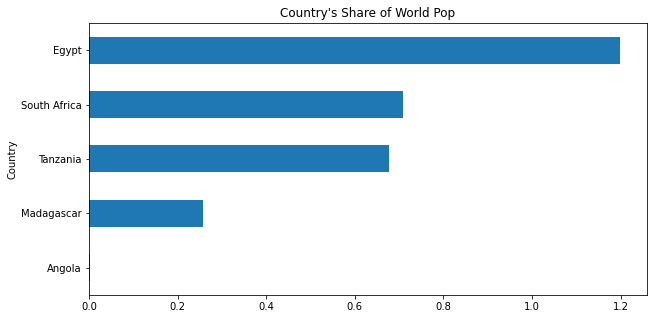

In [45]:
df_tanzania_egypt_south_africa_madagascar_angola_1955_2050_preprocess.groupby('Country')["Country's Share of World Pop" ].mean().nlargest(20).sort_values().plot(kind='barh' ,figsize=(10,5) )
plt.title("Country's Share of World Pop")
plt.ylabel('Country')    
plt.show()  

urban population growth % annual 2000-2021_processed 

In [62]:
df_urban_population_growth_annual_2000_2021_processed =pd.read_csv('../../task 2 data preprocessing/processedData/urban population growth % annual 2000-2021_processed.csv')
df_urban_population_growth_annual_2000_2021_processed  

,Country,Year,Urban population growth (annual %)
0,Angola,2000,5.648670
1,Burundi,2000,4.621538
2,Benin,2000,3.871488
3,Burkina Faso,2000,6.857565
4,Botswana,2000,3.677006
...,...,...,...
1073,Tanzania,2021,5.050038
1074,Uganda,2021,5.583485
1075,South Africa,2021,1.728207
1076,Zambia,2021,4.094430


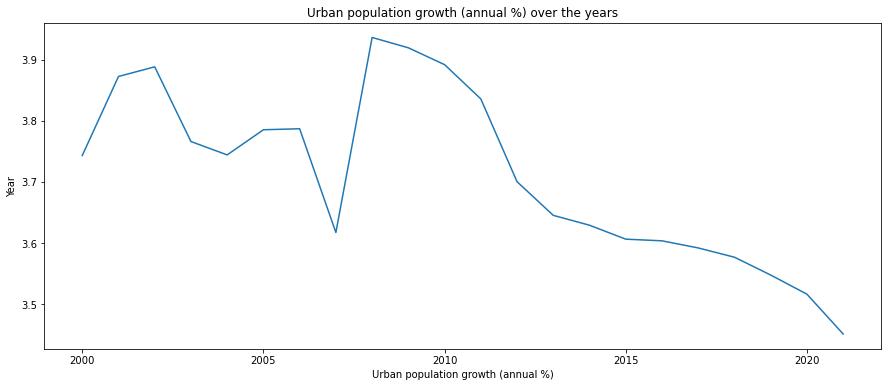

In [64]:
df_urban_population_growth_annual_2000_2021_processed.groupby('Year')['Urban population growth (annual %)' ].mean().plot(figsize=(15,6) )
plt.title('Urban population growth (annual %) over the years')
plt.xlabel('Urban population growth (annual %)') 
plt.ylabel('Year')   
plt.show()  

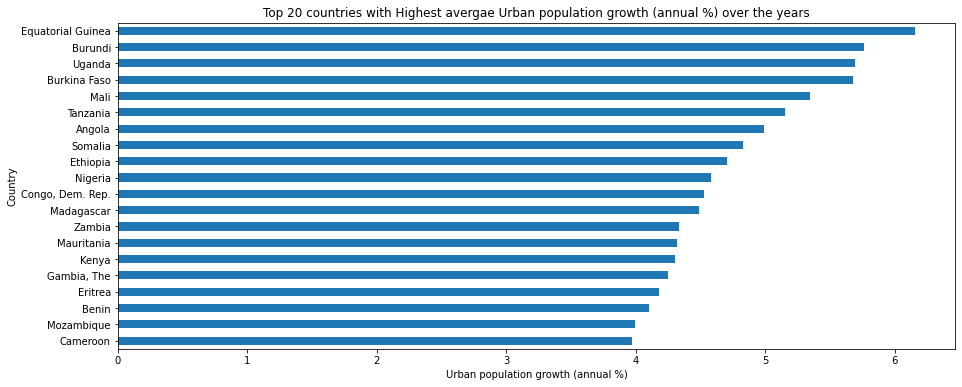

In [65]:
df_urban_population_growth_annual_2000_2021_processed.groupby('Country')['Urban population growth (annual %)' ].mean().nlargest(20).sort_values().plot(kind='barh' ,figsize=(15,6) )
plt.title('Top 20 countries with Highest avergae Urban population growth (annual %) over the years')
plt.xlabel('Urban population growth (annual %)')
plt.ylabel('Country')   
plt.show()   